In [1]:
import numpy as pd 
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler , MinMaxScaler , StandardScaler , LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score , confusion_matrix , classification_report
from sklearn.ensemble import  RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import time
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
%matplotlib inline

C:\Users\2021\anaconda3\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
data = pd.read_csv(r"C:\Users\2021\Desktop\Python\ML\example\skyserver.csv")

In [3]:
data.head()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,STAR,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,STAR,0.000590,3306,54922,512


In [4]:
df = data.copy()

In [5]:
df.head(10)

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,STAR,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,STAR,0.000590,3306,54922,512
5,1.237650e+18,183.847174,0.173694,19.43133,18.46779,18.16451,18.01475,18.04155,752,301,4,269,3.649550e+17,STAR,0.000315,324,51666,594
6,1.237650e+18,183.864379,0.019201,19.38322,17.88995,17.10537,16.66393,16.36955,752,301,4,269,3.232870e+17,GALAXY,0.100242,287,52023,559
7,1.237650e+18,183.900081,0.187473,18.97993,17.84496,17.38022,17.20673,17.07071,752,301,4,269,3.722370e+18,STAR,0.000315,3306,54922,515
8,1.237650e+18,183.924588,0.097246,17.90616,16.97172,16.67541,16.53776,16.47596,752,301,4,270,3.638290e+17,STAR,0.000089,323,51615,595
9,1.237650e+18,183.973498,0.081626,18.67249,17.71375,17.49362,17.28284,17.22644,752,301,4,270,3.243690e+17,GALAXY,0.040508,288,52000,400


In [6]:
print(data['class'].unique())

['STAR' 'GALAXY' 'QSO']


In [7]:
# check the number of columns and rows
print("Data set contains {a} rows and {b} columns".format(a=data.shape[0],b=data.shape[1]))
# print("the shape of training_data is : ",data.shape)

Data set contains 10000 rows and 18 columns


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   objid      10000 non-null  float64
 1   ra         10000 non-null  float64
 2   dec        10000 non-null  float64
 3   u          10000 non-null  float64
 4   g          10000 non-null  float64
 5   r          10000 non-null  float64
 6   i          10000 non-null  float64
 7   z          10000 non-null  float64
 8   run        10000 non-null  int64  
 9   rerun      10000 non-null  int64  
 10  camcol     10000 non-null  int64  
 11  field      10000 non-null  int64  
 12  specobjid  10000 non-null  float64
 13  class      10000 non-null  object 
 14  redshift   10000 non-null  float64
 15  plate      10000 non-null  int64  
 16  mjd        10000 non-null  int64  
 17  fiberid    10000 non-null  int64  
dtypes: float64(10), int64(7), object(1)
memory usage: 1.4+ MB


In [9]:
data.isnull().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
objid,10000.0,1.237650e+18,1.577039e+05,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18
ra,10000.0,1.755300e+02,4.778344e+01,8.235100e+00,1.573709e+02,1.803945e+02,2.015473e+02,2.608844e+02
dec,10000.0,1.483615e+01,2.521221e+01,-5.382632e+00,-5.390350e-01,4.041660e-01,3.564940e+01,6.854227e+01
u,10000.0,1.861936e+01,8.286560e-01,1.298897e+01,1.817803e+01,1.885309e+01,1.925923e+01,1.959990e+01
g,10000.0,1.737193e+01,9.454572e-01,1.279955e+01,1.681510e+01,1.749513e+01,1.801015e+01,1.991897e+01
r,10000.0,1.684096e+01,1.067764e+00,1.243160e+01,1.617333e+01,1.685877e+01,1.751267e+01,2.480204e+01
i,10000.0,1.658358e+01,1.141805e+00,1.194721e+01,1.585370e+01,1.655499e+01,1.725855e+01,2.817963e+01
z,10000.0,1.642283e+01,1.203188e+00,1.161041e+01,1.561829e+01,1.638994e+01,1.714145e+01,2.283306e+01
run,10000.0,9.810348e+02,2.733050e+02,3.080000e+02,7.520000e+02,7.560000e+02,1.331000e+03,1.412000e+03
rerun,10000.0,3.010000e+02,0.000000e+00,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02


In [11]:
data.loc[data.duplicated(),:].sum()

objid        0.0
ra           0.0
dec          0.0
u            0.0
g            0.0
r            0.0
i            0.0
z            0.0
run          0.0
rerun        0.0
camcol       0.0
field        0.0
specobjid    0.0
class        0.0
redshift     0.0
plate        0.0
mjd          0.0
fiberid      0.0
dtype: float64

In [12]:
 pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

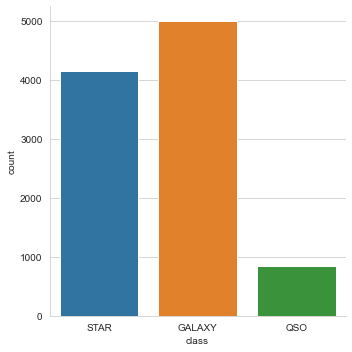

In [13]:
sns.catplot(data = data,x='class',kind='count',orient='v')
plt.show()

In [14]:
data['class'].value_counts()

GALAXY    4998
STAR      4152
QSO        850
Name: class, dtype: int64

In [15]:
data.columns.values

array(['objid', 'ra', 'dec', 'u', 'g', 'r', 'i', 'z', 'run', 'rerun',
       'camcol', 'field', 'specobjid', 'class', 'redshift', 'plate',
       'mjd', 'fiberid'], dtype=object)

In [16]:
# ['objid', 'run', 'rerun', 'camcol', 'field', 'specobjid'] are values which describe parts of the camera at the moment 

data.drop(['objid', 'run', 'rerun', 'camcol', 'field', 'specobjid'], axis =1,inplace =True)

In [17]:
data.head()

,ra,dec,u,g,r,i,z,class,redshift,plate,mjd,fiberid
0,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,STAR,-0.000009,3306,54922,491
1,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,STAR,-0.000055,323,51615,541
2,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,GALAXY,0.123111,287,52023,513
3,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,STAR,-0.000111,3306,54922,510
4,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,STAR,0.000590,3306,54922,512


In [18]:
data.shape

(10000, 12)

In [19]:
# To start the univariate analysis we will plot histograms for the 'redshift' feature column for each class.

#This will tell us how the redshift values are distributed over their range.

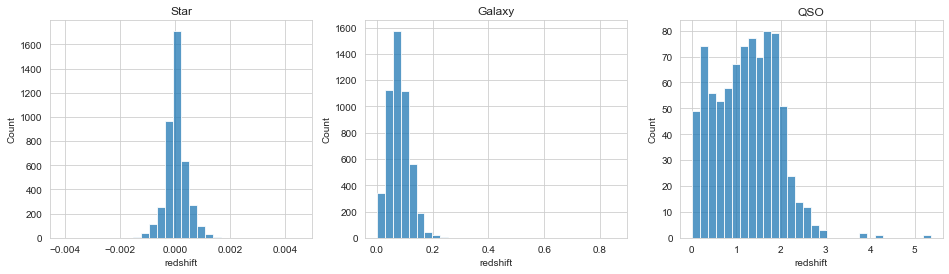

In [20]:
fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(16, 4))
ax = sns.histplot(data[data['class']=='STAR'].redshift, bins = 30, ax = axes[0], kde = False)
ax.set_title('Star')
ax = sns.histplot(data[data['class']=='GALAXY'].redshift, bins = 30, ax = axes[1], kde = False)
ax.set_title('Galaxy')
ax = sns.histplot(data[data['class']=='QSO'].redshift, bins = 30, ax = axes[2], kde = False)
ax = ax.set_title('QSO')

In [21]:
# Star: The histogram looks like a truncated zero-centered normal distribution.

# Galaxy: The redshift values may come from a slightly right-shifted normal distribution which is centered around 0.075.

# QSO: The redshift values for QSOs are a lot more uniformly distributed than for Stars or Galaxies. They are roughly evenly distributed from 0 to 3, than the occurences decrease drastically. For 4 oder ~5.5 there are some outliers.

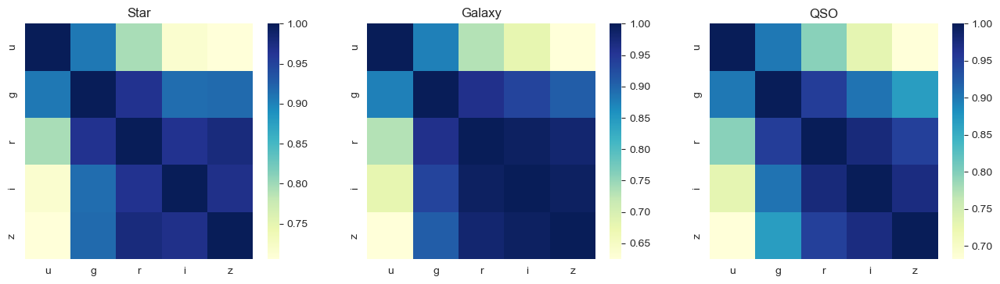

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(16, 4))
fig.set_dpi(100)
ax = sns.heatmap(data[data['class']=='STAR'][['u', 'g', 'r', 'i', 'z']].corr(), ax = axes[0], cmap = 'YlGnBu')
ax.set_title('Star')
ax = sns.heatmap(data[data['class']=='GALAXY'][['u', 'g', 'r', 'i', 'z']].corr(), ax = axes[1], cmap = 'YlGnBu')
ax.set_title('Galaxy')
ax = sns.heatmap(data[data['class']=='QSO'][['u', 'g', 'r', 'i', 'z']].corr(), ax = axes[2], cmap = 'YlGnBu')
ax = ax.set_title('QSO')

In [23]:
label_encoder = LabelEncoder()

In [24]:
data["class"] = label_encoder.fit_transform(data["class"])
data.head()

,ra,dec,u,g,r,i,z,class,redshift,plate,mjd,fiberid
0,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,2,-0.000009,3306,54922,491
1,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,2,-0.000055,323,51615,541
2,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,0,0.123111,287,52023,513
3,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,2,-0.000111,3306,54922,510
4,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,2,0.000590,3306,54922,512


In [25]:
pca = PCA(n_components=3)
pca_columns = pca.fit_transform(data[['u','g','r','i','z']])


In [26]:
data = pd.concat((data , pd.DataFrame(pca_columns)),axis=1)

In [27]:
data.head()

,ra,dec,u,g,r,i,z,class,redshift,plate,mjd,fiberid,0,1,2
0,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,2,-0.000009,3306,54922,491,-1.507202,-1.377293,-0.265119
1,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,2,-0.000055,323,51615,541,-0.195758,-0.028410,-0.155695
2,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,0,0.123111,287,52023,513,1.297604,-0.590023,0.140338
3,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,2,-0.000111,3306,54922,510,-1.446117,0.566685,-0.009272
4,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,2,0.000590,3306,54922,512,-0.849271,1.287505,-0.397689


In [28]:
data.rename({0: 'PCA_1', 1: 'PCA_2', 2: 'PCA_3'}, axis=1, inplace = True)

In [29]:
data.head()

,ra,dec,u,g,r,i,z,class,redshift,plate,mjd,fiberid,PCA_1,PCA_2,PCA_3
0,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,2,-0.000009,3306,54922,491,-1.507202,-1.377293,-0.265119
1,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,2,-0.000055,323,51615,541,-0.195758,-0.028410,-0.155695
2,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,0,0.123111,287,52023,513,1.297604,-0.590023,0.140338
3,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,2,-0.000111,3306,54922,510,-1.446117,0.566685,-0.009272
4,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,2,0.000590,3306,54922,512,-0.849271,1.287505,-0.397689


In [30]:
data.drop(['u','g','r','i','z'] , axis=1,inplace=True)

In [31]:
data.head()

,ra,dec,class,redshift,plate,mjd,fiberid,PCA_1,PCA_2,PCA_3
0,183.531326,0.089693,2,-0.000009,3306,54922,491,-1.507202,-1.377293,-0.265119
1,183.598370,0.135285,2,-0.000055,323,51615,541,-0.195758,-0.028410,-0.155695
2,183.680207,0.126185,0,0.123111,287,52023,513,1.297604,-0.590023,0.140338
3,183.870529,0.049911,2,-0.000111,3306,54922,510,-1.446117,0.566685,-0.009272
4,183.883288,0.102557,2,0.000590,3306,54922,512,-0.849271,1.287505,-0.397689


# Machine Learning Models 


In [32]:
x=data.drop("class",axis=1)

y=data["class"].values

In [33]:
print(x.shape)
print(y.shape)

(10000, 9)
(10000,)


In [34]:
# scaler = MinMaxScaler()
# x=scaler.fit_transform(x) # this is a big error 
# print(x.shape)

In [35]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2,random_state=10)
print("the shape of x_train : ",x_train.shape)
print("the shape of x_test : ",x_test.shape)
print("the shape of y_train : ",y_train.shape)
print("the shape of y_test : ",y_test.shape)

the shape of x_train :  (8000, 9)
the shape of x_test :  (2000, 9)
the shape of y_train :  (8000,)
the shape of y_test :  (2000,)


In [36]:
x_train

,ra,dec,redshift,plate,mjd,fiberid,PCA_1,PCA_2,PCA_3
7496,206.411169,0.042313,0.047631,299,51671,597,1.427204,-0.395619,-0.060525
7694,255.238626,60.021587,0.097660,353,51703,343,-2.377641,-0.185233,0.172989
9248,186.902347,-0.933597,0.000114,2558,54140,13,1.567511,-0.522798,-0.200565
2470,171.154415,-0.991867,0.025585,280,51612,6,-5.820695,0.298245,0.103769
4392,156.713125,0.211090,0.056057,272,51941,597,-1.170432,0.029238,0.010601
...,...,...,...,...,...,...,...,...,...
9372,210.408304,0.067371,0.085028,301,51942,594,-2.920793,0.371662,0.195955
7291,129.070593,50.171841,0.048323,445,51873,192,1.236126,-0.292821,-0.009875
1344,248.213621,-0.043717,0.000257,348,51671,268,-1.814569,1.189988,-0.261604
7293,129.396916,50.152864,0.119299,3697,55290,272,-1.203853,-1.351014,-0.028589


In [37]:
# scaler = MinMaxScaler()
scaler = StandardScaler()

In [38]:
x_train = scaler.fit_transform(x_train)
x_test = scaler.fit_transform(x_test)

# K Nearest Neighbors


In [39]:
knn = KNeighborsClassifier()
parameters = {'n_neighbors':[6,7,8,9,10,11,12,13]}
gs_knn = GridSearchCV(knn,parameters,cv=5)
gs_knn.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [6, 7, 8, 9, 10, 11, 12, 13]})

In [40]:
sorted(gs_knn.cv_results_.keys())
gs_results = pd.DataFrame(gs_knn.cv_results_)[['mean_test_score', 'std_test_score', 'params' , 'rank_test_score' , 'mean_fit_time']]
gs_results.head()

,mean_test_score,std_test_score,params,rank_test_score,mean_fit_time
0,0.954000,0.003885,{'n_neighbors': 6},4,0.037587
1,0.955250,0.003527,{'n_neighbors': 7},1,0.033021
2,0.954125,0.002974,{'n_neighbors': 8},3,0.037175
3,0.955000,0.004330,{'n_neighbors': 9},2,0.032238
4,0.953000,0.004548,{'n_neighbors': 10},5,0.017070


In [41]:
print('score : ' , gs_knn.best_score_)
print('params : ' , gs_knn.best_params_)
print('best : ' , gs_knn.best_estimator_)

score :  0.95525
params :  {'n_neighbors': 7}
best :  KNeighborsClassifier(n_neighbors=7)


In [42]:
knn_gs = KNeighborsClassifier(n_neighbors=7)
training_start = time.perf_counter()
knn_gs.fit(x_train,y_train)
training_end = time.perf_counter()
knn_train_time = training_end-training_start
print("Time consumed for training: %4.3f seconds" % (knn_train_time))

Time consumed for training: 0.081 seconds


In [43]:
prediction_start = time.perf_counter()
preds = knn_gs.predict(x_test)
prediction_end = time.perf_counter()
knn_prediction_time = prediction_end-prediction_start
accuracy_knn = accuracy_score(y_test,preds)
print("Scikit-Learn's K Nearest Neighbors Classifier's prediction accuracy is: " ,accuracy_knn)


Scikit-Learn's K Nearest Neighbors Classifier's prediction accuracy is:  0.9625


# Random Forest Classifier


In [44]:
rf_gs = RandomForestClassifier()
parameters = {'n_estimators':[10,15,20,30,50]}
gs_rf = GridSearchCV(rf_gs,parameters,cv=5)
gs_rf.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': [10, 15, 20, 30, 50]})

In [45]:
sorted(gs_rf.cv_results_.keys())
gs_results_rf = pd.DataFrame(gs_rf.cv_results_)[['mean_test_score', 'std_test_score', 'params' , 'rank_test_score' , 'mean_fit_time']]
gs_results_rf.head()

,mean_test_score,std_test_score,params,rank_test_score,mean_fit_time
0,0.991375,0.002942,{'n_estimators': 10},1,0.139630
1,0.991375,0.002179,{'n_estimators': 15},1,0.233576
2,0.990750,0.002284,{'n_estimators': 20},5,0.400843
3,0.991000,0.002894,{'n_estimators': 30},4,0.511339
4,0.991375,0.002512,{'n_estimators': 50},1,0.599930


In [46]:
print('score : ' , gs_rf.best_score_)
print('params : ' , gs_rf.best_params_)
print('best : ' , gs_rf.best_estimator_)

score :  0.991375
params :  {'n_estimators': 10}
best :  RandomForestClassifier(n_estimators=10)


In [47]:
rf =  RandomForestClassifier(n_estimators=50)

In [48]:
training_start = time.perf_counter()
rf.fit(x_train, y_train)
training_end = time.perf_counter()
rf_train_time = training_end-training_start
print("Time consumed for training: %4.3f seconds" % (rf_train_time))

Time consumed for training: 0.870 seconds


In [49]:
prediction_start = time.perf_counter()
preds = rf.predict(x_test)
prediction_end = time.perf_counter()
rf_prediction_time = prediction_end-prediction_start
accuracy_rf = accuracy_score(y_test,preds)
print("Time consumed for prediction: %6.5f seconds" % (rf_prediction_time))
print("Scikit-Learn's Random Forest Classifier's prediction accuracy is: ",accuracy_rf)

Time consumed for prediction: 0.02688 seconds
Scikit-Learn's Random Forest Classifier's prediction accuracy is:  0.893


# LogisticRegression

In [50]:
# lg_gs =LogisticRegression(max_iter = 500)
# parameters = {"penalty":['l1','l2'],'solver':[ 'liblinear', 'saga']}
# gs_lg = GridSearchCV(lg_gs,parameters,cv=5)
# gs_lg.fit(x_train,y_train)

In [51]:
# sorted(gs_lg.cv_results_.keys())
# gs_results_lg = pd.DataFrame(gs_lg.cv_results_)[['mean_test_score', 'std_test_score', 'params' , 'rank_test_score' , 'mean_fit_time']]
# gs_results_lg.head()

In [52]:
# print('score : ' , gs_lg.best_score_)
# print('params : ' , gs_lg.best_params_)
# print('best : ' , gs_lg.best_estimator_)

In [53]:
lg = LogisticRegression(max_iter=500, penalty='l1', solver='saga')

In [54]:
training_start = time.perf_counter()
lg.fit(x_train, y_train)
training_end = time.perf_counter()
lg_train_time = training_end-training_start
print("Time consumed for training: %4.3f seconds" % (lg_train_time))

Time consumed for training: 2.603 seconds


C:\Users\2021\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [55]:
prediction_start = time.perf_counter()
preds = lg.predict(x_test)
prediction_end = time.perf_counter()
lg_prediction_time = prediction_end-prediction_start
accuracy_lg = accuracy_score(y_test,preds)
print("Time consumed for prediction: %6.5f seconds" % (lg_prediction_time))
print("Scikit-Learn's LogisticRegression prediction accuracy is: ",accuracy_lg)

Time consumed for prediction: 0.00119 seconds
Scikit-Learn's LogisticRegression prediction accuracy is:  0.9875


# Support Vector Machine Classifier


In [56]:
sv_gs = SVC()
parameters = {'C':[1,2,3,4,5],'kernel':['linear','poly','rbf']}
gs_sv = GridSearchCV(sv_gs,parameters,cv=5)
gs_sv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [1, 2, 3, 4, 5],
                         'kernel': ['linear', 'poly', 'rbf']})

In [57]:
sorted(gs_sv.cv_results_.keys())
gs_results_sv = pd.DataFrame(gs_sv.cv_results_)[['mean_test_score', 'std_test_score', 'params' , 'rank_test_score' , 'mean_fit_time']]
gs_results_sv.head()

,mean_test_score,std_test_score,params,rank_test_score,mean_fit_time
0,0.982875,0.002640,"{'C': 1, 'kernel': 'linear'}",5,0.428659
1,0.961375,0.006701,"{'C': 1, 'kernel': 'poly'}",15,0.680577
2,0.966875,0.005863,"{'C': 1, 'kernel': 'rbf'}",11,0.788181
3,0.986000,0.002727,"{'C': 2, 'kernel': 'linear'}",4,0.726989
4,0.965000,0.004921,"{'C': 2, 'kernel': 'poly'}",14,0.463674


In [58]:
print('score : ' , gs_sv.best_score_)
print('params : ' , gs_sv.best_params_)
print('best : ' , gs_sv.best_estimator_)

score :  0.9885000000000002
params :  {'C': 5, 'kernel': 'linear'}
best :  SVC(C=5, kernel='linear')


In [59]:
sv =  SVC(C=5, kernel='linear')

In [60]:
training_start = time.perf_counter()
sv.fit(x_train, y_train)
training_end = time.perf_counter()
sv_train_time = training_end-training_start
print("Time consumed for training: %4.3f seconds" % (sv_train_time))

Time consumed for training: 1.218 seconds


In [61]:
prediction_start = time.perf_counter()
preds = sv.predict(x_test)
prediction_end = time.perf_counter()
sv_prediction_time = prediction_end-prediction_start
accuracy_sv = accuracy_score(y_test,preds)
print("Time consumed for prediction: %6.5f seconds" % (sv_prediction_time))
print("Scikit-Learn's Support Vector Machine prediction accuracy is: ",accuracy_score(y_test,preds))

Time consumed for prediction: 0.03930 seconds
Scikit-Learn's Support Vector Machine prediction accuracy is:  0.992


In [62]:
results = pd.DataFrame({
    'Model': ['KNN','Random Forest','Logistic Regression', 'SVC'],
    'Score': [accuracy_knn, accuracy_rf, accuracy_lg, accuracy_sv],
    'Runtime Training': [knn_train_time , rf_train_time , lg_train_time , sv_train_time],
    'Runtime Prediction': [knn_prediction_time, rf_prediction_time, lg_prediction_time, sv_prediction_time]})
result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Model')
result_df

,Score,Runtime Training,Runtime Prediction
Model,,,
SVC,0.9920,1.218418,0.039296
Logistic Regression,0.9875,2.602591,0.001194
KNN,0.9625,0.080969,0.257051
Random Forest,0.8930,0.869704,0.026880
